# **Paute Water Balance and Drought Analysis (PART 4)**

## Section 4: Vegetation and Drought Indices

### A Comprehensive Guide to Vegetation Indices and Their Applications

Vegetation Indices: A Powerful Tool for Remote Sensing

Vegetation indices are essential tools in remote sensing, providing valuable insights into vegetation health, biomass, and overall ecosystem dynamics. By analyzing the spectral reflectance of plant canopies, these indices can quantify various biophysical parameters.

### Common Vegetation Indices

-  Difference Vegetation Index (NDVI): This is perhaps the most widely used vegetation index, calculated as:
NDVI = (NIR - RED) / (NIR + RED)
where NIR is the near-infrared reflectance and RED is the red reflectance.

- Enhanced Vegetation Index (EVI): EVI is a modified version of NDVI that is less sensitive to atmospheric and soil background noise:
EVI = G * [(NIR - RED) / (NIR + C1 * RED - C2 * BLUE + L)]
where G, C1, C2, and L are coefficients that adjust the sensitivity of the index.

### Applications of Vegetation Indices

- Monitoring Crop Health: Tracking changes in vegetation indices can help farmers identify stress, diseases, or nutrient deficiencies in crops.

- Assessing Forest Health: Monitoring forest health, detecting deforestation, and assessing forest carbon sequestration.

- Mapping Land Cover and Land Use: Distinguishing between different land cover types, such as forests, grasslands, and urban areas.

- Drought Monitoring: Tracking changes in vegetation water stress and identifying drought-affected areas.
Beyond Vegetation Indices: Other Remote Sensing Indices


### Using MODIS EVI for Vegetation Monitoring

In the next section, we'll utilize the MODIS EVI product to calculate monthly vegetation indices. This readily available product provides pre-processed EVI data, reducing the need for complex calculations and atmospheric corrections. By analyzing these indices, we can gain valuable insights into vegetation dynamics and their response to environmental factors.

### Drought Indices:

- Normalized Difference Moisture Index (NDMI): Used to assess soil moisture conditions.

- Vegetation Condition Index (VCI): Monitors vegetation health and stress.

- Standardized Precipitation Index (SPI): Measures precipitation anomalies over various time scales.

- Land Surface Temperature (LST): Measures the temperature of the Earth's surface, which can be used to study urban heat islands, evapotranspiration, and other phenomena.

- Albedo: Measures the reflectivity of a surface, which can be used to study energy balance and climate change.

In [ ]:
# !pip install geopandas
!pip install Cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 50.3 MB/s eta 0:00:00


In [ ]:
import ee

import geemap
from geemap import cartoee
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
import geopandas as gpd
import numpy as np



In [ ]:
# Trigger the authentication flow.
ee.Authenticate()

# Initialize the library.
ee.Initialize(project='ee-geospatial-analyses')

In [ ]:
# Load HydroBASINS dataset
hydrobasins = ee.FeatureCollection("WWF/HydroSHEDS/v1/Basins/hybas_7")

# Define a point inside the Paute Basin (latitude, longitude)
pautePoint = ee.Geometry.Point([-78.8, -2.65])  # Approximate location in Ecuador

# Filter the basin that contains the point
pauteBasin = hydrobasins.filterBounds(pautePoint)

# Initialize the map
Map = geemap.Map()
Map.centerObject(pauteBasin, zoom=7)

# Add the basin to the map
Map.addLayer(pauteBasin, {}, "Paute Basin")

# Display the map
Map

Map(center=[-2.6561001766080143, -78.56026731888969], controls=(WidgetControl(options=['position', 'transparen…

In [ ]:
# Set start and end years.
startYear = 2010;
endYear = 2020;

# Create two date objects for start and end years.
startDate = ee.Date.fromYMD(startYear, 1, 1);
endDate = ee.Date.fromYMD(endYear + 1, 1, 1);

# Make a list with years.
years_ee = ee.List.sequence(startYear, endYear)

# Make a list with months.
months_ee = ee.List.sequence(1, 12)

In [ ]:
# Import and filter the MOD13 dataset.
mod13 = ee.ImageCollection('MODIS/MOD09GA_006_EVI');

# Select the EVI
mod13 = mod13.filterDate(startDate, endDate);
EVI = mod13.select('EVI');

In [ ]:
EVI

In [ ]:
# Get the first image from the collection
first_image = EVI.first()

# Get the minimum and maximum values of the EVI band in the first image
min_value = first_image.select('EVI').reduceRegion(
    reducer=ee.Reducer.min(),
    geometry=pauteBasin,
    scale=500
).get('EVI')

max_value = first_image.select('EVI').reduceRegion(
    reducer=ee.Reducer.max(),
    geometry=pauteBasin,
    scale=500
).get('EVI')

# Print the values
print('Minimum EVI value:', min_value.getInfo())
print('Maximum EVI value:', max_value.getInfo())

Minimum EVI value: -0.0840825453020916
Maximum EVI value: 0.6856585788561526


In [ ]:
# The function returns an image with the mean EVI for each month
monthlyEVI = ee.ImageCollection.fromImages(
    years_ee.map(lambda y:
        months_ee.map(lambda m:
            ee.Image(EVI
                .filter(ee.Filter.calendarRange(y, y, 'year'))
                .filter(ee.Filter.calendarRange(m, m, 'month'))
                .mean()
                .set('year', y)
                .set('month', m)
                .set('system:time_start', ee.Date.fromYMD(y, m, 1))
            )
        )
    ).flatten()
)

In [ ]:
# Get the first image from the collection
first_image = monthlyEVI.first()

# Get the minimum and maximum values of the EVI band in the first image
min_value = first_image.select('EVI').reduceRegion(
    reducer=ee.Reducer.min(),
    geometry=pauteBasin,
    scale=500
).get('EVI')

max_value = first_image.select('EVI').reduceRegion(
    reducer=ee.Reducer.max(),
    geometry=pauteBasin,
    scale=500
).get('EVI')

# Print the values
print('Minimum monthlyEVI value:', min_value.getInfo())
print('Maximum monthlyEVI value:', max_value.getInfo())

Minimum monthlyEVI value: -0.055456310736836274
Maximum monthlyEVI value: 0.3739241169248828


In [ ]:
monthlyEVI

In [ ]:
monthlyEVI_mean = monthlyEVI.mean().clip(pauteBasin)

# Use reduceRegion to calculate the min and max
stats = monthlyEVI_mean.reduceRegion(
    reducer=ee.Reducer.minMax(),  # Reducer to get min and max
    geometry=pauteBasin,                 # Specify the ROI
    scale=500,                   # Scale in meters
    maxPixels=1e9                 # Maximum number of pixels to process
)

# Get the results as a dictionary
min_max = stats.getInfo()

# Print the min and max values
print('Min and Max values:', min_max)

Min and Max values: {'EVI_max': 0.3210145037418509, 'EVI_min': -0.04978952849799056}


In [ ]:
monthlyEVI_mean

In [ ]:
EVIVis = {
    'min': -1,
    'max':1,
    'palette': ['yellow', 'green']  # Yellow indicating low ET and blue indicating high ET.
}

# Initialize the map
Map = geemap.Map()
Map.centerObject(pauteBasin, zoom=8)

# Add the EVI layer
Map.addLayer(
    monthlyEVI_mean,
    EVIVis,
    'EVI'
)


# Create legend entries with EVI min/max and corresponding colors
legend_dict = {
    'Yellow (Min: -0.05)': '#FFFF00',
    'Green (Max: 0.32)': '#228B22',

}

Map.add_legend(title="EVI", legend_dict=legend_dict)

# Display the map
Map

Map(center=[-2.6561001766079806, -78.5602673188897], controls=(WidgetControl(options=['position', 'transparent…

Text(-78.7, -2.7, 'Paute')

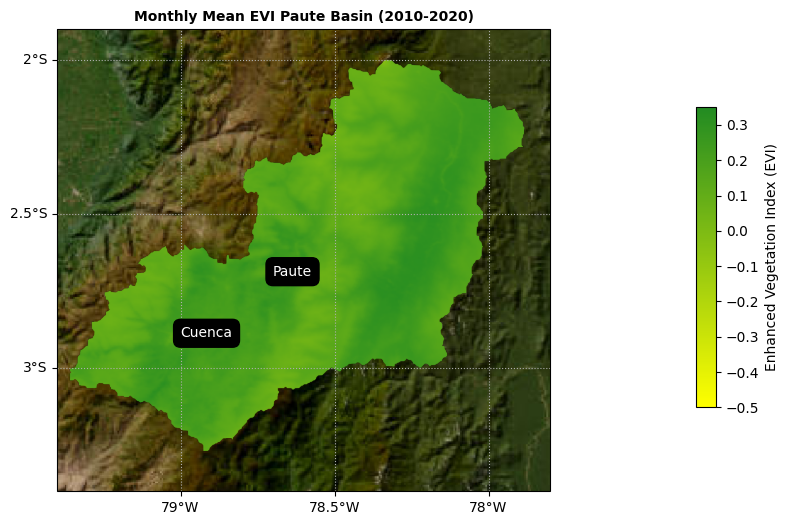

In [ ]:
# set parameters for plotting
# will plot the image with specific range and colormap
visualization = {"bands": "EVI", "min": -0.5, "max": 0.35}
# specify region to focus on
bbox = [-77.8, -3.4, -79.4, -1.9]

# Selext Open Street map BaseMap
#basemap= cimgt.OSM()

fig = plt.figure(figsize=(10, 6))

# Define a custom color palette
palette = ['#FFFF00', '#228B22']  # Yellow to Green


# Create visualization parameters
vis_params = {'min': -0.5,
              'max': 0.35,
              'palette': palette,
              }

# Add the layer to the map
ax = cartoee.get_map(monthlyEVI_mean, vis_params=vis_params, region=bbox, basemap="SATELLITE", zoom_level=8)

# Add a colorbar
cb = cartoee.add_colorbar(ax, loc="right", vis_params=vis_params, label="Enhanced Vegetation Index (EVI)")

# Adds tittle
ax.set_title(label="Monthly Mean EVI Paute Basin (2010-2020)", fontsize=10, fontweight='bold')

# add the gridlines and specify that the xtick
cartoee.add_gridlines(ax, interval=0.5, xtick_rotation=0, linestyle=":")

# add a marker for Cuenca
ax.plot(-79, -2.9, 'ko')
ax.text(-79, -2.9, 'Cuenca', color='white', bbox=dict(facecolor='black', edgecolor='black', boxstyle='round,pad=0.5'))

# add a marker for Paute
ax.plot(-78.7, -2.7, 'ko')
ax.text(-78.7, -2.7, 'Paute', color='white', bbox=dict(facecolor='black', edgecolor='black', boxstyle='round,pad=0.5'))

In [ ]:
# Function to convert images into features
def image_to_feature(image):

    mean = image.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=pauteBasin,
        scale=500
    )
    # Create a Feature with the statistics
    feature = ee.Feature(None, mean).set('id', image.id())
    return feature

# Explicitly convert the collection to features
EVI_feature_collection = ee.FeatureCollection(monthlyEVI.map(image_to_feature))

# Use geemap to export to GeoDataFrame
EVI_gdf = geemap.ee_to_gdf(EVI_feature_collection, columns=None, sort_columns=False)

# Check the result
EVI_gdf

,geometry,EVI,id
0,None,0.141483,0
1,None,0.117787,1
2,None,0.165413,2
3,None,0.174098,3
4,None,0.191436,4
...,...,...,...
127,None,0.246297,127
128,None,0.203962,128
129,None,0.216781,129
130,None,0.234969,130


In [ ]:
EVI_gdf.describe()

,EVI
count,132.000000
mean,0.182843
std,0.031844
min,0.112670
25%,0.159649
50%,0.181352
75%,0.205349
max,0.258331


In [ ]:
# Convert the ee.List to Python lists
years = years_ee.getInfo()
months = months_ee.getInfo()

In [ ]:
# Add 'year' and 'month' columns using a lambda function
EVI_gdf['year'] = list(map(lambda y: y, [year for year in years for _ in months]))
EVI_gdf['month'] = list(map(lambda m: m, months * len(years)))

# Drop unnecessary columns
EVI_gdf = EVI_gdf.drop(columns=["geometry", "id"])

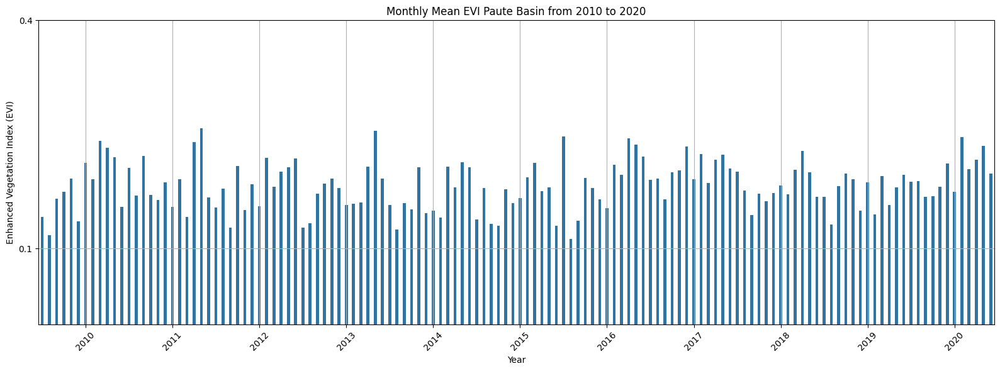

In [ ]:
# Create the 'time' column as a combination of 'year' and 'month' for grouping
EVI_gdf['time'] = EVI_gdf['year'].astype(str) + '-' + EVI_gdf['month'].astype(str)

# Plotting the bar plot
plt.figure(figsize=(16, 6))

# Create the bar plot
sns.barplot(x='time', y='EVI', data=EVI_gdf, width=0.4)

# Add labels and title
plt.xlabel('Year')
plt.ylabel('Enhanced Vegetation Index (EVI)')
plt.title('Monthly Mean EVI Paute Basin from 2010 to 2020')

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Get the list of years from 2010 to 2020
years = list(range(2010, 2021))

# Calculate positions for x-axis ticks and labels, adding separation between years
year_labels = [str(year) for year in years]
ticks = [i * 12 + 6 for i in range(len(years))]  # Place labels in the middle of each 12-month group

# Adjust spacing between groups of 12 bars by modifying the tick positions
plt.xticks(ticks=ticks, labels=year_labels)

# Adjust yticks spacing
plt.yticks(np.arange(0.10, 0.5, 0.30))

# Add gridlines
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
# Set start and end years.
startYear = 2019;
endYear = 2024;

# Create two date objects for start and end years.
startDate = ee.Date.fromYMD(startYear, 1, 1);
endDate = ee.Date.fromYMD(endYear, 11, 30);

# Make a list with years.
years_ee = ee.List.sequence(startYear, endYear)

# Make a list with months.
months_ee = ee.List.sequence(1, 12)

In [ ]:
# Load the Sentinel-2 surface reflectance image collection
Sentinel_collection = (
    ee.ImageCollection('COPERNICUS/S2_SR')
    .filterBounds(pauteBasin)
    .filterDate(startDate, endDate)
    .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))  # Filter for less than 20% cloud cover
)


In [ ]:
print(Sentinel_collection.first().bandNames().getInfo())


['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9', 'B11', 'B12', 'AOT', 'WVP', 'SCL', 'TCI_R', 'TCI_G', 'TCI_B', 'MSK_CLDPRB', 'MSK_SNWPRB', 'QA10', 'QA20', 'QA60']


In [ ]:
Sentinel_collection

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor


In [ ]:
# Function to calculate MSI for each image
def calculate_msi(image):
    swir = image.select('B11')  # Shortwave Infrared (SWIR) band
    nir = image.select('B8')   # Near-Infrared (NIR) band
    msi = swir.divide(nir).rename('MSI')
    # return image.addBands(msi) to add the msi band to the rest of the bands (24 in total)
    return msi

In [ ]:
# Map the function over the collection
MSI_collection = Sentinel_collection.map(calculate_msi)

In [ ]:
print(MSI_collection.first().bandNames().getInfo())

['MSI']


In [ ]:
print(MSI_collection.size().getInfo())  # Total number of images in the collection
print(MSI_collection.first().bandNames().getInfo())  # Bands in the first image


92
['MSI']


In [ ]:
# Reduce the collection to a single image (mean MSI over the time period)
MSI_mean = MSI_collection.select('MSI').mean().clip(pauteBasin)

# Use reduceRegion to calculate the min and max
stats = MSI_mean.reduceRegion(
    reducer=ee.Reducer.minMax(),  # Reducer to get min and max
    geometry=pauteBasin,                 # Specify the ROI
    scale=500,                   # Scale in meters
    maxPixels=1e9                 # Maximum number of pixels to process
)

# Get the results as a dictionary
min_max = stats.getInfo()

# Print the min and max values
print('Min and Max values:', min_max)

Min and Max values: {'MSI_max': 2.349419355392456, 'MSI_min': 0.4627145528793335}


In [ ]:
# For visualization, define visualization parameters

vis_params = {
    'min': 0,
    'max': 1,
    'palette': ['blue', 'green', 'yellow', 'red']
}

# Display the MSI image

Map = geemap.Map()
Map.centerObject(pauteBasin, 8)
Map.addLayer(MSI_mean, vis_params, 'MSI')
Map.addLayer(pauteBasin, {}, 'ROI', opacity=0.5)
Map

Map(center=[-2.6561001766080143, -78.56026731888969], controls=(WidgetControl(options=['position', 'transparen…

Text(-78.7, -2.7, 'Paute')

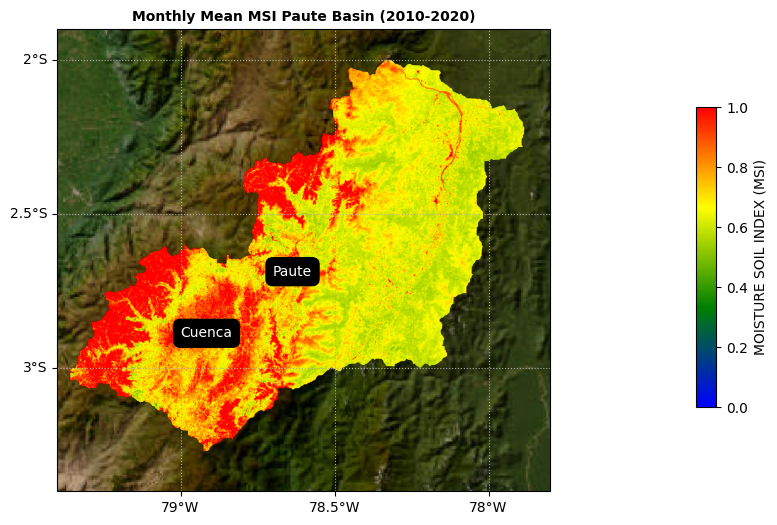

In [ ]:
# set parameters for plotting
# will plot the image with specific range and colormap
visualization = {"bands": "MSI", "min": 0, "max": 4}
# specify region to focus on
bbox = [-77.8, -3.4, -79.4, -1.9]

# Selext Open Street map BaseMap
#basemap= cimgt.OSM()

fig = plt.figure(figsize=(10, 6))

# Define a custom color palette
palette = ['#0000FF', '#008000', '#FFFF00', '#FF0000']  # Blue to Red


# Create visualization parameters
vis_params = {'min': 0,
              'max': 1,
              'palette': palette,
              }

# Add the layer to the map
ax = cartoee.get_map(MSI_mean, vis_params=vis_params, region=bbox, basemap="SATELLITE", zoom_level=8)

# Add a colorbar
cb = cartoee.add_colorbar(ax, loc="right", vis_params=vis_params, label="MOISTURE SOIL INDEX (MSI)")

# Adds tittle
ax.set_title(label="Monthly Mean MSI Paute Basin (2010-2020)", fontsize=10, fontweight='bold')

# add the gridlines and specify that the xtick
cartoee.add_gridlines(ax, interval=0.5, xtick_rotation=0, linestyle=":")

# add a marker for Cuenca
ax.plot(-79, -2.9, 'ko')
ax.text(-79, -2.9, 'Cuenca', color='white', bbox=dict(facecolor='black', edgecolor='black', boxstyle='round,pad=0.5'))

# add a marker for Paute
ax.plot(-78.7, -2.7, 'ko')
ax.text(-78.7, -2.7, 'Paute', color='white', bbox=dict(facecolor='black', edgecolor='black', boxstyle='round,pad=0.5'))

In [ ]:
# Function to convert images into features
def image_to_feature(image):

    mean = image.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=pauteBasin,
        scale=500
    )
    # Create a Feature with the statistics
    feature = ee.Feature(None, mean).set('id', image.id())
    return feature

# Explicitly convert the collection to features
MSI_feature_collection = ee.FeatureCollection(MSI_collection.map(image_to_feature))

# Use geemap to export to GeoDataFrame
MSI_gdf = geemap.ee_to_gdf(MSI_feature_collection, columns=None, sort_columns=False)

# Check the result
#MSI_gdf

In [ ]:
# Function to extract the date of each image
def extract_image_date(image):
    # Get the image date
    date = ee.Date(image.get('system:time_start')).format('YYYY-MM-dd')
    # Return the date as a feature
    return ee.Feature(None, {'date': date})

# Map the function over the collection to create a FeatureCollection of dates
dates_feature_collection = ee.FeatureCollection(
    Sentinel_collection.map(extract_image_date)
)

# Convert the dates FeatureCollection to a GeoDataFrame
dates_gdf = geemap.ee_to_gdf(
    dates_feature_collection,
    columns=['date'],  # Only keep the date column
    sort_columns=True
)

# Extract the dates as a list from the dates GeoDataFrame
dates_list = dates_gdf['date'].tolist()

# Add the dates list as a new column to the MSI_gdf DataFrame
MSI_gdf['date'] = dates_list

# Check the updated DataFrame
MSI_gdf


,geometry,MSI,id,date
0,None,0.715186,20190517T153621_20190517T154349_T17MQS,2019-05-17
1,None,0.632211,20190517T153621_20190517T154349_T17MRS,2019-05-17
2,None,0.719302,20190527T153621_20190527T153622_T17MQS,2019-05-27
3,None,0.537988,20190711T153629_20190711T153627_T17MRS,2019-07-11
4,None,0.543419,20190711T153629_20190711T153627_T17MRT,2019-07-11
...,...,...,...,...
87,None,0.663458,20240912T153629_20240912T154332_T17MRS,2024-09-12
88,None,0.703466,20240912T153629_20240912T154332_T17MRT,2024-09-12
89,None,0.701739,20241012T153629_20241012T154017_T17MRT,2024-10-12
90,None,0.890672,20241111T153619_20241111T153851_T17MQS,2024-11-11


In [ ]:
MSI_gdf.describe()

,MSI
count,92.000000
mean,0.694488
std,0.114311
min,0.536094
25%,0.597519
50%,0.690346
75%,0.760401
max,1.147979


In [ ]:
MSI_gdf = MSI_gdf.drop(['geometry', 'id'], axis=1)
MSI_gdf

,MSI,date
0,0.715186,2019-05-17
1,0.632211,2019-05-17
2,0.719302,2019-05-27
3,0.537988,2019-07-11
4,0.543419,2019-07-11
...,...,...
87,0.663458,2024-09-12
88,0.703466,2024-09-12
89,0.701739,2024-10-12
90,0.890672,2024-11-11


In [ ]:
MSI_gdf.dtypes

,0
MSI,float64
date,object


In [ ]:
# Transform the 'date' column to datetime
MSI_gdf['date'] = pd.to_datetime(MSI_gdf['date'])

# Check the result
print(MSI_gdf.info())  # Verify the column type
print(MSI_gdf.head())  # Preview the updated DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92 entries, 0 to 91
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   MSI     92 non-null     float64       
 1   date    92 non-null     datetime64[ns]
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.6 KB
None
        MSI       date
0  0.715186 2019-05-17
1  0.632211 2019-05-17
2  0.719302 2019-05-27
3  0.537988 2019-07-11
4  0.543419 2019-07-11


In [ ]:
# Extract the year from the 'date' column
MSI_gdf['year'] = MSI_gdf['date'].dt.year

# Group by 'year' and calculate the mean of MSI values
# Replace 'MSI_value_column' with the actual name of the column containing MSI values
yearly_avg_msi = MSI_gdf.groupby('year')['MSI'].mean().reset_index()

# Rename columns for clarity
yearly_avg_msi.rename(columns={'MSI_value_column': 'average_MSI'}, inplace=True)

# Check the result
yearly_avg_msi


,year,MSI
0,2019,0.641903
1,2020,0.636464
2,2021,0.677344
3,2022,0.768435
4,2023,0.772063
5,2024,0.760674


In [ ]:
# Convert the ee.List to Python lists
#years = years_ee.getInfo()
#months = months_ee.getInfo()

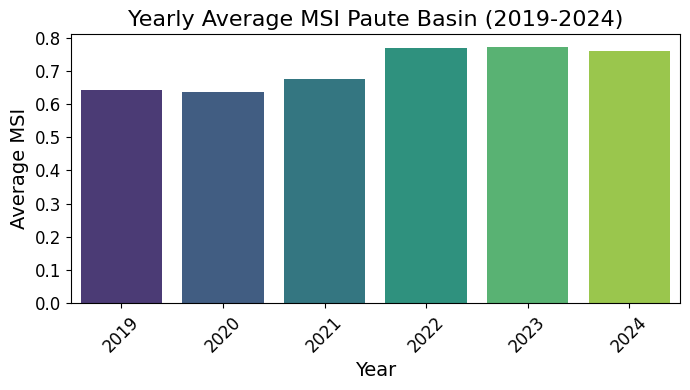

In [ ]:
# Create the bar plot
plt.figure(figsize=(7, 4))
sns.barplot(
    data=yearly_avg_msi,
    x='year',  # x-axis: years
    y='MSI',  # y-axis: average MSI values
    palette='viridis'  # Optional: a color palette
)

# Add labels and a title
plt.title('Yearly Average MSI Paute Basin (2019-2024)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average MSI', fontsize=14)
plt.xticks(rotation=45, fontsize=12)  # Rotate x-axis labels if needed
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
# Count the number of data points for each year
yearly_counts = MSI_gdf.groupby('year').size().reset_index(name='count')

# Check the result
yearly_counts

,year,count
0,2019,17
1,2020,23
2,2021,17
3,2022,13
4,2023,9
5,2024,13


# Calculation with Lansat Images

In [ ]:
# Define the cloud filter percentage
CLOUD_FILTER = 20

# Load Landsat 8 surface reflectance data
landsat_collection = ee.ImageCollection("LANDSAT/LC08/C02/T1_L2") \
    .filterBounds(pauteBasin) \
    .filterMetadata('CLOUD_COVER', 'less_than', CLOUD_FILTER)

In [ ]:
# Get the longest date range available for the region of interest
date_range = landsat_collection.reduceColumns(
    ee.Reducer.minMax(), ["system:time_start"]
)
start_date = ee.Date(date_range.get('min')).format("YYYY-MM-dd").getInfo()
end_date = ee.Date(date_range.get('max')).format("YYYY-MM-dd").getInfo()

print(f"Data available from {start_date} to {end_date}")

Data available from 2013-04-27 to 2024-11-19


In [ ]:
# Filter collection by the date range
landsat_filtered = landsat_collection.filterDate(start_date, end_date)

# Function to calculate MSI
def calculate_msi(image):
    msi = image.select('SR_B6').divide(image.select('SR_B5')).rename('MSI')
    return image.addBands(msi)
    #return msi

# Apply MSI calculation to the filtered collection
landsat_msi = landsat_filtered.map(calculate_msi)

In [ ]:
# Reduce the collection to a single image (mean MSI over the time period)
Lansat_MSI_mean = landsat_msi.select('MSI').mean().clip(pauteBasin)

# Use reduceRegion to calculate the min and max
stats = Lansat_MSI_mean.reduceRegion(
    reducer=ee.Reducer.minMax(),  # Reducer to get min and max
    geometry=pauteBasin,                 # Specify the ROI
    scale=500,                   # Scale in meters
    maxPixels=1e9                 # Maximum number of pixels to process
)

# Get the results as a dictionary
min_max = stats.getInfo()

# Print the min and max values
print('Min and Max values:', min_max)

Min and Max values: {'MSI_max': 1.1692737340927124, 'MSI_min': 0.44221577048301697}


In [ ]:
# For visualization, define visualization parameters

vis_params = {
    'min': 0,
    'max': 1,
    'palette': ['blue', 'green', 'yellow', 'red']
}

# Display the MSI image

Map = geemap.Map()
Map.centerObject(pauteBasin, 8)
Map.addLayer(Lansat_MSI_mean, vis_params, 'MSI')
Map.addLayer(pauteBasin, {}, 'ROI', opacity=0.5)
Map

Map(center=[-2.6561001766080143, -78.56026731888969], controls=(WidgetControl(options=['position', 'transparen…

Text(-78.7, -2.7, 'Paute')

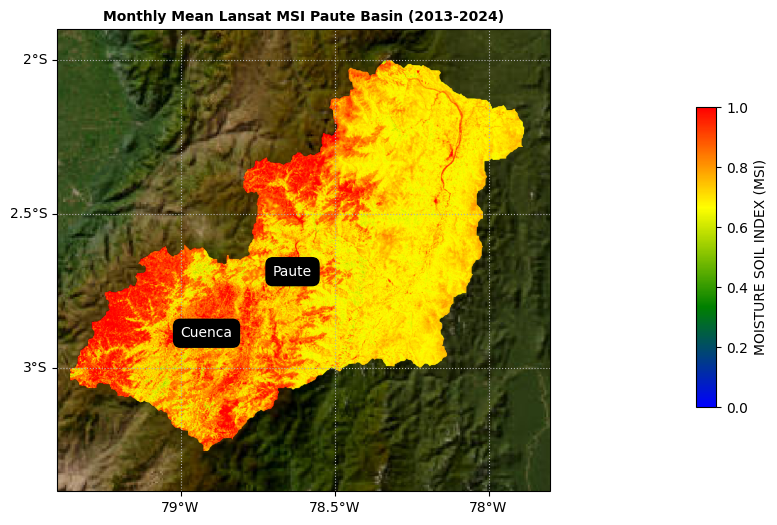

In [ ]:
# set parameters for plotting
# will plot the image with specific range and colormap
visualization = {"bands": "MSI", "min": 0, "max": 4}
# specify region to focus on
bbox = [-77.8, -3.4, -79.4, -1.9]

# Selext Open Street map BaseMap
#basemap= cimgt.OSM()

fig = plt.figure(figsize=(10, 6))

# Define a custom color palette
palette = ['#0000FF', '#008000', '#FFFF00', '#FF0000']  # Blue to Red


# Create visualization parameters
vis_params = {'min': 0,
              'max': 1,
              'palette': palette,
              }

# Add the layer to the map
ax = cartoee.get_map(Lansat_MSI_mean, vis_params=vis_params, region=bbox, basemap="SATELLITE", zoom_level=8)

# Add a colorbar
cb = cartoee.add_colorbar(ax, loc="right", vis_params=vis_params, label="MOISTURE SOIL INDEX (MSI)")

# Adds tittle
ax.set_title(label="Monthly Mean Lansat MSI Paute Basin (2013-2024)", fontsize=10, fontweight='bold')

# add the gridlines and specify that the xtick
cartoee.add_gridlines(ax, interval=0.5, xtick_rotation=0, linestyle=":")

# add a marker for Cuenca
ax.plot(-79, -2.9, 'ko')
ax.text(-79, -2.9, 'Cuenca', color='white', bbox=dict(facecolor='black', edgecolor='black', boxstyle='round,pad=0.5'))

# add a marker for Paute
ax.plot(-78.7, -2.7, 'ko')
ax.text(-78.7, -2.7, 'Paute', color='white', bbox=dict(facecolor='black', edgecolor='black', boxstyle='round,pad=0.5'))

In [ ]:
# Function to convert images into features
def image_to_feature(image):

    mean = image.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=pauteBasin,
        scale=500
    )
    # Create a Feature with the statistics
    feature = ee.Feature(None, mean).set('id', image.id())
    return feature

# Explicitly convert the collection to features
Lansat_MSI_feature_collection = ee.FeatureCollection(landsat_msi.map(image_to_feature))

# Use geemap to export to GeoDataFrame
Lansat_MSI_gdf = geemap.ee_to_gdf(Lansat_MSI_feature_collection, columns=None, sort_columns=False)

# Check the result
#MSI_gdf

In [ ]:
# Function to extract the date of each image
def extract_image_date(image):
    # Get the image date
    date = ee.Date(image.get('system:time_start')).format('YYYY-MM-dd')
    # Return the date as a feature
    return ee.Feature(None, {'date': date})

# Map the function over the collection to create a FeatureCollection of dates
dates_feature_collection = ee.FeatureCollection(
    landsat_msi.map(extract_image_date)
)

# Convert the dates FeatureCollection to a GeoDataFrame
dates_gdf = geemap.ee_to_gdf(
    dates_feature_collection,
    columns=['date'],  # Only keep the date column
    sort_columns=True
)

# Extract the dates as a list from the dates GeoDataFrame
dates_list = dates_gdf['date'].tolist()

# Add the dates list as a new column to the MSI_gdf DataFrame
Lansat_MSI_gdf['date'] = dates_list

# Select "date" and "MSI" columns

Lansat_MSI_gdf = Lansat_MSI_gdf[["date", "MSI"]]


# Check the updated DataFrame
Lansat_MSI_gdf



,date,MSI
0,2013-04-27,0.721542
1,2013-09-02,0.683909
2,2015-09-08,0.695596
3,2018-10-18,0.697983
4,2019-08-18,0.710659
5,2020-03-13,0.742830
6,2022-09-27,0.713969
7,2024-08-31,0.714863
8,2024-10-02,0.691615
9,2024-10-18,0.747652


In [ ]:
# Transform the 'date' column to datetime
MSI_gdf['date'] = pd.to_datetime(MSI_gdf['date'])

# Check the result
print(MSI_gdf.info())  # Verify the column type
print(MSI_gdf.head())  # Preview the updated DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92 entries, 0 to 91
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   MSI     92 non-null     float64       
 1   date    92 non-null     datetime64[ns]
 2   year    92 non-null     int32         
dtypes: datetime64[ns](1), float64(1), int32(1)
memory usage: 1.9 KB
None
        MSI       date  year
0  0.715186 2019-05-17  2019
1  0.632211 2019-05-17  2019
2  0.719302 2019-05-27  2019
3  0.537988 2019-07-11  2019
4  0.543419 2019-07-11  2019


In [ ]:
# Function to extract the date of each image
def extract_image_date(image):
    # Get the image date
    date = ee.Date(image.get('system:time_start')).format('YYYY-MM-dd')
    # Return the date as a feature
    return ee.Feature(None, {'date': date})

# Map the function over the collection to create a FeatureCollection of dates
dates_feature_collection = ee.FeatureCollection(
    landsat_msi.map(extract_image_date)
)

# Convert the dates FeatureCollection to a GeoDataFrame
dates_gdf = geemap.ee_to_gdf(
    dates_feature_collection,
    columns=['date'],  # Only keep the date column
    sort_columns=True
)

# Extract the dates as a list from the dates GeoDataFrame
dates_list = dates_gdf['date'].tolist()

# Add the dates list as a new column to the MSI_gdf DataFrame
Lansat_MSI_gdf['date'] = dates_list

# Select "date" and "MSI" columns

Lansat_MSI_gdf = Lansat_MSI_gdf[["date", "MSI"]]


# Check the updated DataFrame
Lansat_MSI_gdf



,date,MSI
0,2013-04-27,0.721542
1,2013-09-02,0.683909
2,2015-09-08,0.695596
3,2018-10-18,0.697983
4,2019-08-18,0.710659
5,2020-03-13,0.742830
6,2022-09-27,0.713969
7,2024-08-31,0.714863
8,2024-10-02,0.691615
9,2024-10-18,0.747652


In [ ]:
# Transform the 'date' column to datetime
Lansat_MSI_gdf['date'] = pd.to_datetime(Lansat_MSI_gdf['date'])

# Check the result
print(Lansat_MSI_gdf.info())  # Verify the column type
print(Lansat_MSI_gdf.head())  # Preview the updated DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    27 non-null     datetime64[ns]
 1   MSI     27 non-null     float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 560.0 bytes
None
        date       MSI
0 2013-04-27  0.721542
1 2013-09-02  0.683909
2 2015-09-08  0.695596
3 2018-10-18  0.697983
4 2019-08-18  0.710659


In [ ]:
# Extract the year from the 'date' column
Lansat_MSI_gdf['year'] = Lansat_MSI_gdf['date'].dt.year

# Group by 'year' and calculate the mean of MSI values
# Replace 'MSI_value_column' with the actual name of the column containing MSI values
yearly_avg_msi = Lansat_MSI_gdf.groupby('year')['MSI'].mean().reset_index()

# Rename columns for clarity
yearly_avg_msi.rename(columns={'MSI_value_column': 'average_MSI'}, inplace=True)

# Check the result
yearly_avg_msi

,year,MSI
0,2013,0.702848
1,2015,0.723317
2,2016,0.730523
3,2018,0.694175
4,2019,0.710695
5,2020,0.721277
6,2022,0.705987
7,2024,0.713858


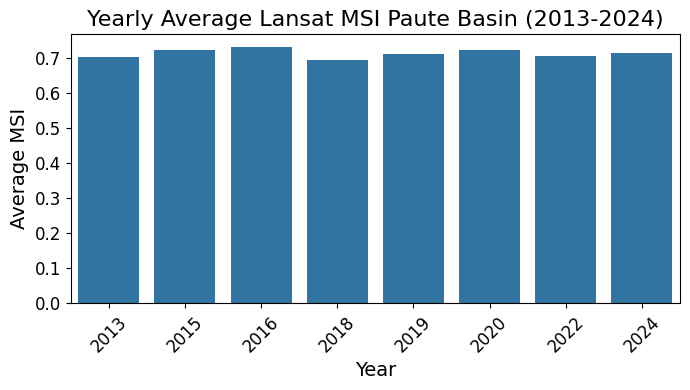

In [ ]:
# Create the bar plot
plt.figure(figsize=(7, 4))
sns.barplot(
    data=yearly_avg_msi,
    x='year',  # x-axis: years
    y='MSI',  # y-axis: average MSI values
   # palette='viridis'  # Optional: a color palette
)

# Add labels and a title
plt.title('Yearly Average Lansat MSI Paute Basin (2013-2024)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average MSI', fontsize=14)
plt.xticks(rotation=45, fontsize=12)  # Rotate x-axis labels if needed
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

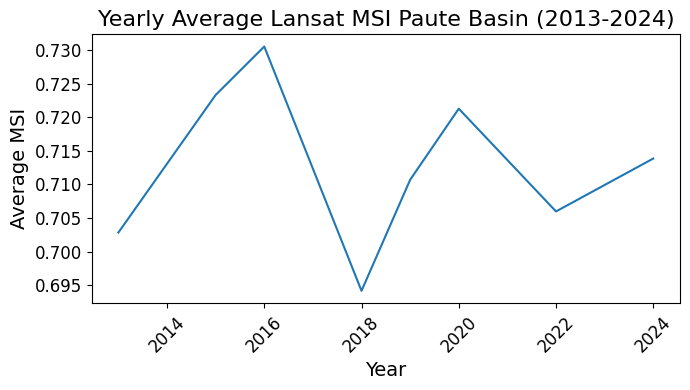

In [ ]:
# Create the bar plot
plt.figure(figsize=(7, 4))
sns.lineplot(
    data=yearly_avg_msi,
    x='year',  # x-axis: years
    y='MSI',  # y-axis: average MSI values
   # palette='viridis'  # Optional: a color palette
)

# Add labels and a title
plt.title('Yearly Average Lansat MSI Paute Basin (2013-2024)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average MSI', fontsize=14)
plt.xticks(rotation=45, fontsize=12)  # Rotate x-axis labels if needed
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
# Count the number of data points for each year
yearly_counts = Lansat_MSI_gdf.groupby('year').size().reset_index(name='count')

# Check the result
yearly_counts

,year,count
0,2013,5
1,2015,6
2,2016,2
3,2018,2
4,2019,2
5,2020,3
6,2022,2
7,2024,5
